# Introduction
This colab worksheet provides a starting point for the computer vision assignment.

# Data Loading

In [ ]:
# Download the data stored in a zipped numpy array from one of these two locations
# If you're running all your experiments
# on a machine at home rather than using colab, then make sure you save it
# rather than repeatedly downloading it.

!wget "https://sussex.box.com/shared/static/eb9cfqjn82zpzwjgfq5vqvg07t3aiqwo" -O training_images.npz

# The test images (without points)
!wget "https://sussex.box.com/shared/static/i0apaktucm7y4od7k4ux69k8t1iue7w8" -O test_images.npz

# The example images are here
!wget "https://sussex.box.com/shared/static/aulkv3tf2fc0765yqgfm9am87vgn3p8a" -O examples.npz


--2024-05-15 18:03:44--  https://sussex.box.com/shared/static/eb9cfqjn82zpzwjgfq5vqvg07t3aiqwo
Resolving sussex.box.com (sussex.box.com)... 74.112.186.144
Connecting to sussex.box.com (sussex.box.com)|74.112.186.144|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /public/static/eb9cfqjn82zpzwjgfq5vqvg07t3aiqwo [following]
--2024-05-15 18:03:44--  https://sussex.box.com/public/static/eb9cfqjn82zpzwjgfq5vqvg07t3aiqwo
Reusing existing connection to sussex.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://sussex.app.box.com/public/static/eb9cfqjn82zpzwjgfq5vqvg07t3aiqwo [following]
--2024-05-15 18:03:45--  https://sussex.app.box.com/public/static/eb9cfqjn82zpzwjgfq5vqvg07t3aiqwo
Resolving sussex.app.box.com (sussex.app.box.com)... 74.112.186.144
Connecting to sussex.app.box.com (sussex.app.box.com)|74.112.186.144|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://euc1.b

# Check the data downloaded correctly
If any of these assertions fail, redownload the data

# Changes from given colab start here.

In [ ]:
def confirm_checksum(filename, true_checksum):
    import subprocess

    checksum = subprocess.check_output(["shasum", filename]).decode("utf-8")
    assert checksum.split(" ")[0] == true_checksum, (
        "Checksum does not match for " + filename + " redownload the data."
    )


confirm_checksum("training_images.npz", "cf2a926d2165322adcd19d2e88b2eb1cd200ea5c")
confirm_checksum("examples.npz", "0fadc9226e4c0efb4479c5c1bf79491d75828ad3")
confirm_checksum("test_images.npz", "c7b4b297c7e5c5009706f893ad1fb77a2aa73f95")


# Load the data

Some name changes made here for ease later

In [ ]:
import numpy as np

# Load the data using np.load
data = np.load("training_images.npz", allow_pickle=True)

# Extract the images
training_images = data["images"]
# and the data points
training_pts = data["points"]

print(training_images.shape, training_pts.shape)

testing_data = np.load("test_images.npz", allow_pickle=True)
testing_images = testing_data["images"]
print(testing_images.shape)

example_data = np.load("examples.npz", allow_pickle=True)
example_images = example_data["images"]
print(example_images.shape)


(2811, 256, 256, 3) (2811, 44, 2)
(554, 256, 256, 3)
(6, 256, 256, 3)


# Data Visualisation
Here's an example of how to display the images and their points

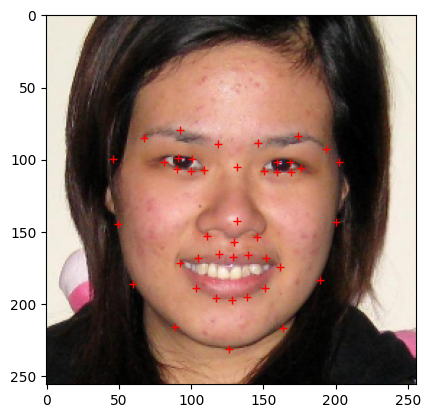

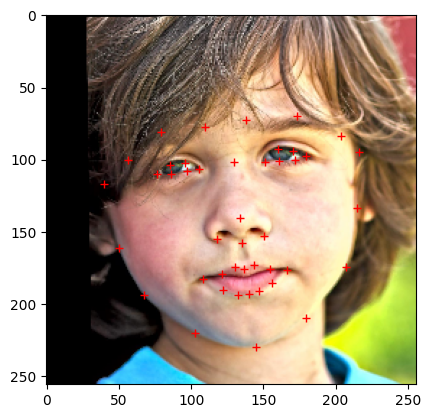

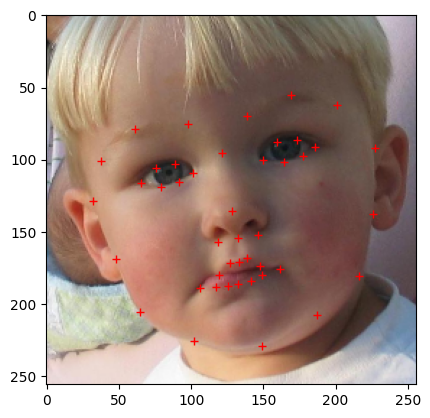

In [ ]:
def visualise_pts(img, pts):
    import matplotlib.pyplot as plt

    plt.imshow(img)
    plt.plot(pts[:, 0], pts[:, 1], "+r")
    plt.show()

    # for i in range(3):
    # idx = np.random.randint(0, images.shape[0])
    # visualise_pts(images[idx, ...], pts[idx, ...])


for i in range(3):
    idx = np.random.randint(0, training_images.shape[0])
    visualise_pts(training_images[idx, ...], training_pts[idx, ...])


# Task 1 Face Alignment

First importing all libraries that will be used.

In [ ]:
import cv2  # OpenCV library
from matplotlib import pyplot as plt  # Matplotlib's pyplot for plotting graphs
import random  # Provides functionalities for generating random numbers
from skimage.feature import hog  # HOG feature extraction from scikit-image
from sklearn.linear_model import Ridge  # Ridge regression model
from sklearn.model_selection import train_test_split  # Split arrays or matrices into random train and test subsets


Image Preprocessing

In [ ]:
def preprocessing(images):
    """
    This function applies a series of preprocessing onto an array of images to enchance & extract edges.
    :param images: The Batch of images (In an array).
    :return: A NumPy array containing the processed images.
    """
    # DocStrings to explain Functions
    processed_images = []  # List to store the images after processing.
    for image in images:
        # Convert to grayscale by averaging the channels
        grayscale_image = np.uint8(np.mean(image, axis=-1))

        # Histogram equalization of the grayscale image
        equalized_image = cv2.equalizeHist(grayscale_image)

        # Reduce Gaussian noise
        blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), sigmaX=3)

        # Calculate gradients in the x and y direction
        sobel_x = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=3)

        # Combine the x and y gradients to get the edge image
        edge_image = cv2.addWeighted(
            cv2.convertScaleAbs(sobel_x), 1, cv2.convertScaleAbs(sobel_y), 1, 0
        )

        processed_images.append(edge_image)

    return np.array(processed_images)


Preparing datasets for validation & training

In [ ]:
# Apply preprocessing to the training, testing, & example set of images
training_images_processed = preprocessing(training_images)
testing_images_processed = preprocessing(testing_images)
example_images_processed = preprocessing(example_images)

# Split the training images and corresponding points into separate training and validation datasets
# This ensures that ground truth data is available to evaluate model performance and accuracy
X_train, X_val, y_train, y_val = train_test_split(
    training_images_processed,
    training_pts,
    test_size=0.2,
    random_state=50,  # A fixed value is used to insure reproducibility
)
# scikit-learn 'train_test_split' is used


Just to see what images look like...

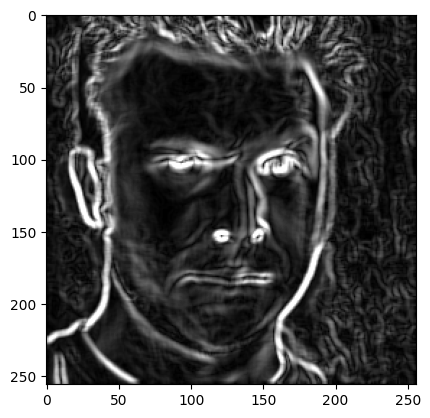

In [ ]:
# Just to load multiple images randomly
random_image = random.randint(0, 2248)

plt.imshow(X_train[random_image], cmap="gray")


Feature extraction algorithm

In [ ]:
# def extract_HOG(images, pixels_per_cell=(30, 30), cells_per_block=(4, 4), orientations=20):
def extract_HOG(
    images, pixels_per_cell=(20, 20), cells_per_block=(4, 4), orientations=15
):
    """
    Extract Histogram of Oriented Gradients features from a collection of images.

      :param images: Preprocessed images from which to extract features.
      :param pixels_per_cell: The size of each cell measured in pixels. Each cell will be used to compute a histogram of gradients.
      :param cells_per_block: The number of cells that make up a block. Normalization will be performed across these blocks.
      :param orientations: The number of orientation bins for the gradient histograms.

      :return: A list where each element is an array of HOG features corresponding to each image.
    """

    # Initialize the list to hold feature vectors for each image
    features = []

    # Process each image to extract HOG features
    for img in images:
        # Calculate HOG features using the skimage.feature.hog() function
        img_features = hog(
            img,
            orientations=orientations,
            pixels_per_cell=pixels_per_cell,
            cells_per_block=cells_per_block,
            block_norm="L2",
        )
        # Append the feature vector of the current image to the list of features
        features.append(img_features)

    return features


Initialise landmarks

In [ ]:
def initialize_landmarks(ground_truth_landmarks):
    """
    Compute the initial guess for landmarks by averaging the ground truth landmarks

    :param ground_truth_landmarks: Ground truth landmark positions for each image
    :return: Initial landmarks replicated for all samples
    """
    # Compute the mean of ground truth landmarks to get the initial guess
    initial_landmarks = np.mean(ground_truth_landmarks, axis=0)

    # Number of samples
    n_samples = ground_truth_landmarks.shape[0]

    # Replicate the initial landmarks for all samples
    current_landmarks = np.tile(initial_landmarks[None, :, :], (n_samples, 1, 1))

    return current_landmarks


Calculate landmark displacement

In [ ]:
def calculate_landmark_displacements(current_landmarks, ground_truth_landmarks):
    """
    Calculate the displacements needed to adjust current landmarks to match ground truth landmarks.

    :param current_landmarks: The current estimated positions of the landmarks.
    :param ground_truth_landmarks: The actual ground truth positions of the landmarks.
    :return: The calculated displacements.
    """
    landmark_displacements = ground_truth_landmarks - current_landmarks
    return landmark_displacements.reshape(landmark_displacements.shape[0], -1)


The SDM model

In [ ]:
def Training(images, ground_truth_landmarks, num_iterations=5, alpha=1.0):
    """
    Train usisng SDM for facial landmark detection.This function iteratively refines
    the predictions of landmark positions by fitting a regression model to predict
    landmark displacements based on HOG features

    :param images: Array of preprocessed images
    :param ground_truth_landmarks: Ground truth landmark positions
    :param num_iterations: Number of iterations for training.
    :param alpha: Regularisation factor Regression model
    :return: A list of trained models.
    """
    # num_iterations can be changed
    models = []  # list of models to allow storing of the trained model

    # Initialize current landmarks for all samples
    current_landmarks = initialize_landmarks(ground_truth_landmarks)

    # Extract HOG features from each image
    features = extract_HOG(images)

    for iteration in range(num_iterations):
        print(f"Iteration: {iteration + 1}")

        # Calculate landmark displacements
        landmark_displacements = calculate_landmark_displacements(
            current_landmarks, ground_truth_landmarks
        )

        # Ridge Regression
        model = Ridge(alpha=alpha)
        model.fit(features, landmark_displacements)

        # Update landmarks
        updates = model.predict(features)
        current_landmarks += updates.reshape(current_landmarks.shape)
        models.append(model)  # append the list

    return models


def Predicting(new_image, initial_landmarks, models):
    """
    Predicts facial landmarks on a new image using a sequence of trained models from the SDM training phase

    :param new_image: The new image to predict landmarks on
    :param initial_landmarks: The initial guess for the landmarks
    :param models: A list of trained regressor models from the SDM training phase.
    :return: The predicted landmark positions.
    """

    current_landmarks = np.copy(initial_landmarks)

    for model in models:
        # Extract HOG features from new image
        features = extract_HOG(new_image)
        features = np.array(features)

        # Predict updates using the current model
        updates = model.predict(features)

        # Update the current landmarks with the predicted changes
        current_landmarks += updates.reshape(current_landmarks.shape)

    return current_landmarks


Training the models

In [ ]:
# models = Training(training_images_processed, training_pts, alpha=500, extraction_type='hog')
# models = Training(X_train, y_train, alpha=400)
models = Training(training_images_processed, training_pts, alpha=500)

Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5


To get some initial landmarks

In [ ]:
def compute_initial_landmarks(training_pts):
    """
    Compute the initial landmarks as the mean of given training points.

    :args training_pts: A numpy array of shape

    :return: A numpy array containing the mean landmarks.
    """
    # Calculate the mean of the training points along the axis 0
    initial_landmarks = np.mean(training_pts, axis=0)

    # Reshape the mean to the format (1, 44, 2)
    initial_landmarks = initial_landmarks.reshape(1, 44, 2)

    return initial_landmarks


Predict and display predicted landmarks on example images

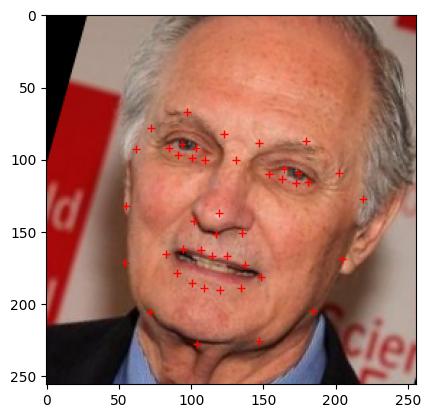

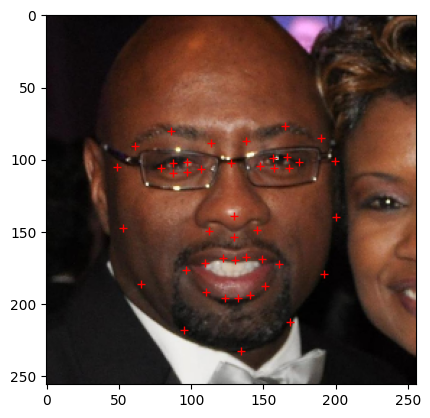

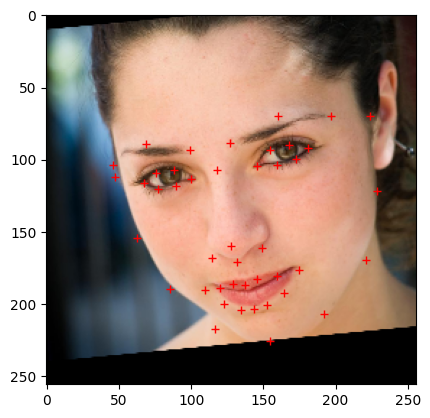

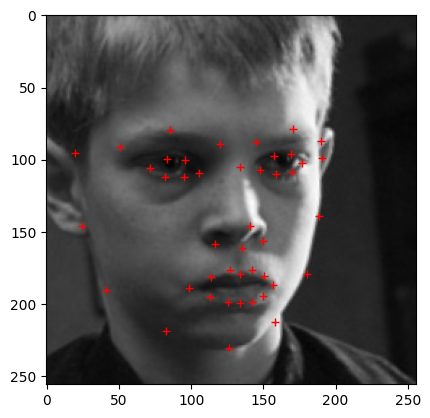

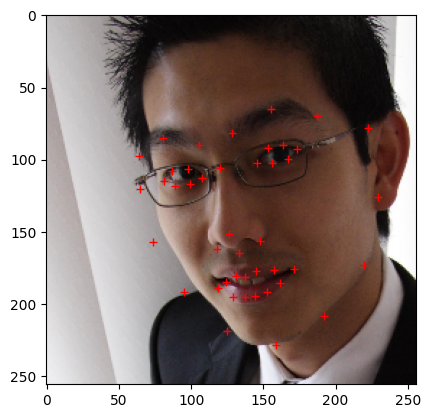

...

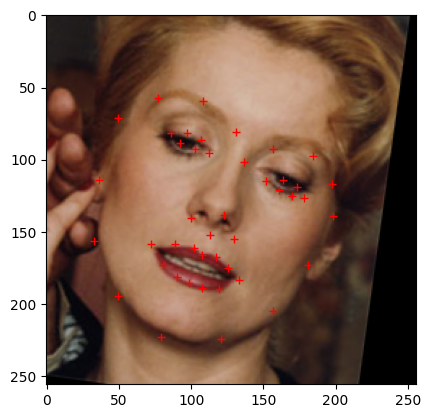

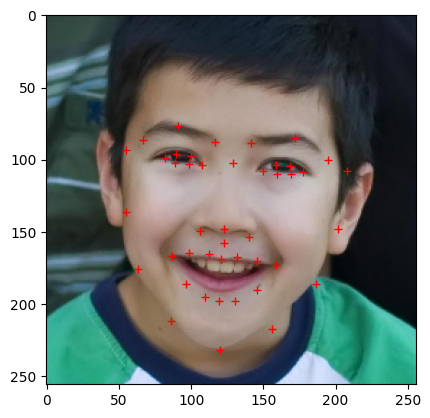

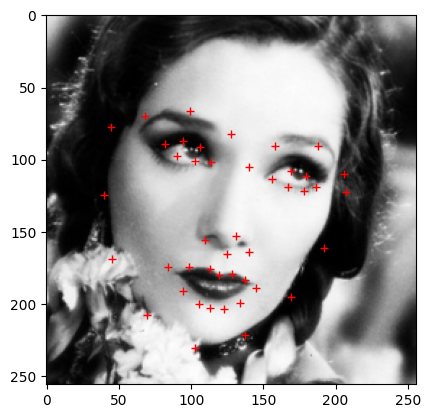

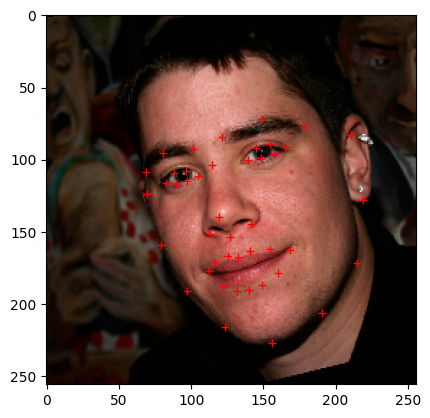

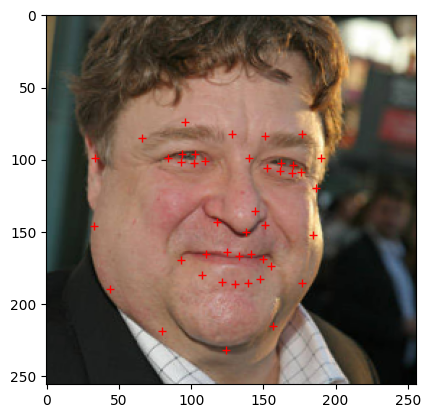

In [ ]:
# Compute initial landmarks
initial_landmarks = compute_initial_landmarks(training_pts)

# # Iterate over processed example images
# for i in range(len(example_images_processed)):
#     # Reshape the image
#     example_image = example_images_processed[i].reshape(1, 256, 256)

#     # Predict landmarks using the model and initial landmarks
#     landmarks = Predicting(example_image, initial_landmarks, models)

#     # Reshape the output to get coordinates
#     landmarks = landmarks.reshape(44, 2)

#     # Visualize the predicted landmarks on the original image
#     visualise_pts(example_images[i], landmarks)


# ^^^ uncomment for example images
for i in range(20):
    # Randomly select an index from the testing images
    idx = np.random.randint(0, testing_images_processed.shape[0])

    # Reshape selected image
    test_image = testing_images_processed[idx].reshape(1, 256, 256)

    # Use the model to predict landmarks based on the reshaped test image and initial landmarks
    landmarks = Predicting(test_image, initial_landmarks, models)

    # Reshape predicted landmarks
    landmarks = landmarks.reshape(44, 2)

    # Display the test image with the predicted landmarks overlayed
    visualise_pts(testing_images[idx], landmarks)


This function was already given

In [ ]:
def euclid_dist(pred_pts, gt_pts):
  """
  Calculate the euclidean distance between pairs of points
  :param pred_pts: The predicted points
  :param gt_pts: The ground truth points
  :return: An array of shape (no_points,) containing the distance of each predicted point from the ground truth
  """
  pred_pts = np.reshape(pred_pts, (-1, 2))
  gt_pts = np.reshape(gt_pts, (-1, 2))
  return np.sqrt(np.sum(np.square(pred_pts - gt_pts), axis=-1))

Function to calculate the mean

In [ ]:
def mean_euclidean_distance(images, true_pts, initial_landmarks, models):
    """
    Calculate the mean Euclidean distance between predicted and true landmark points for a batch of images

      :param images: Array of images of shape.
      :param true_points: Array of true landmark points.
      :param initial_landmarks: Initial landmark points used.
      :param models: model used for predicting landmark points.

      :return: The mean Euclidean distance across all images.
    """
    distances = []  # List to store the Euclidean distances

    for i, true_points in enumerate(true_pts):
        # Prepare the image as required by the Predicting function
        testing_images_processed = images[i].reshape(1, 256, 256)
        # Predict points using the provided model and initial landmarks
        pred_pts = Predicting(testing_images_processed, initial_landmarks, models)
        pred_pts = pred_pts.reshape(44, 2)
        # Calculate the Euclidean distance and append to the list
        distances.append(euclid_dist(pred_pts, true_points))
    # Calculate the mean of the distances

    distances = np.array(
        distances
    )  # SOLVED! ValueError: cannot reshape array of size 48752 into shape (1,44,2)
    total_mean_distance = np.mean(distances)

    return total_mean_distance


Print the mean

In [ ]:
initial_landmarks = compute_initial_landmarks(training_pts)

print(f"The mean euclidean distance:  {mean_euclidean_distance(X_val, y_val, initial_landmarks, models)}")

The mean euclidean distance:  4.428738590802079


# Second Task (Eyes and Lips Colour Change)

Similar to task 1...

In [ ]:
def preprocessing_singles(image):
    """
    Similar to task's 1 preprocessing.

    :param image: the input image

    :return: the processed image
    """

    # Convert the input image to grayscale by averaging the colour channels
    gray_img = np.uint8(np.mean(image, axis=-1))

    # Apply histogram equalization to improve the contrast of the grayscale image
    eq_img = cv2.equalizeHist(gray_img)

    # Reduce noise using a Gaussian blur with a 5x5 kernel and a sigma of 3
    blurred = cv2.GaussianBlur(eq_img, (5, 5), 3)

    # Calculate the gradients in the x and y directions using Sobel operator
    sobelx = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)

    # Combine the gradients to form the final edge-detected image
    edge_image = cv2.addWeighted(
        cv2.convertScaleAbs(sobelx), 1, cv2.convertScaleAbs(sobely), 1, 0
    )

    return edge_image


Reshape the image

In [ ]:
def reshape_image(image):
    img_prep = preprocessing_singles(image)
    return img_prep.reshape(1, 256, 256)


Using SDM

In [ ]:
def predict_landmarks(preprocessed_img, initial_landmarks, models):
    pts = Predicting(preprocessed_img, initial_landmarks, models)
    return pts.reshape(44, 2)


Creating the masks

In [ ]:
def create_masks(pts, image_shape):
    """
    Creates binary masks for the eyes and lips

    :param pts: cords of landmarks
    :param image_shape: image shape...

    :return:'binary_image'
    """
    eye_left = np.array(pts[20:26], dtype=np.int32).reshape((-1, 1, 2))
    eye_right = np.array(pts[26:32], dtype=np.int32).reshape((-1, 1, 2))
    lips = np.array(pts[32:44], dtype=np.int32).reshape((-1, 1, 2))

    binary_image = np.zeros(image_shape[:2], dtype=np.uint8)
    # Fill polygons based on reshaped points
    cv2.fillPoly(binary_image, [eye_left, eye_right, lips], 1)

    return binary_image > 0


Applying the mask

In [ ]:
def apply_colour_mask(image, mask_indices, colour, alpha=0.6):
    """
    Applies a coloured mask to the image with transparency.
    :param image: The original image.
    :param mask_indices: A boolean array where True indicates the pixels to colour.
    :param colour: A tuple representing the RGB values to apply.
    :param alpha: The transparency factor, where 1 is opaque and 0 is fully transparent.
    :return: The image with the colour applied on masked areas.
    """
    coloured_image = np.copy(image)
    # Apply the colour, blending it with the original using alpha
    for i in range(3):  # Loop through colour channels
        coloured_image[:, :, i][mask_indices] = (
            alpha * colour[i] + (1 - alpha) * coloured_image[:, :, i][mask_indices]
        ).astype(np.uint8)
    return coloured_image


Changing the colours

In [ ]:
def change_colour(image, initial_landmarks, models):
    """
     Changes the colour of the eyes and lips.
    :param image: The original image.
    :param initial_landmarks: he initial guess of the landmarks
    :param models: The SDM used.
    :return: The images with the colour applied on masked areas.
    """
    # Preprocess the image
    img_prep = reshape_image(image)
    # Predict facial landmarks
    pts = predict_landmarks(img_prep, initial_landmarks, models)
    # Create masks
    mask_indices = create_masks(pts, image.shape)

    # Define colours
    colours = {"red": (200, 0, 0), "green": (0, 200, 0), "blue": (0, 0, 200)}
    # Apply the defined colours
    edited_images = {
        colour: apply_colour_mask(image, mask_indices, rgb)
        for colour, rgb in colours.items()
    }

    # Display the original and edited images
    plt.figure(figsize=(15, 6))
    titles = ["Original Image"] + [
        f"Changed to {colour.capitalize()}" for colour in colours
    ]
    images = [image] + list(edited_images.values())

    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, 5, i)
        plt.title(title)
        plt.imshow(img)
        plt.axis("off")

    plt.show()


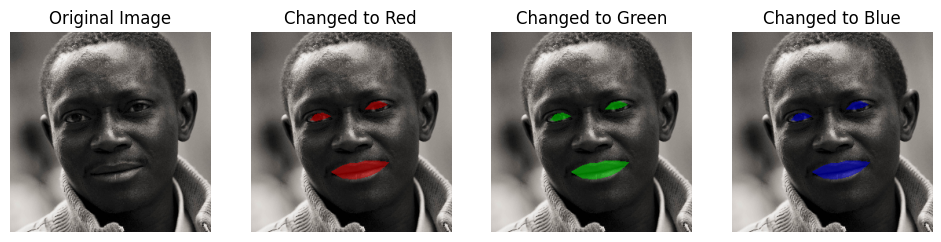

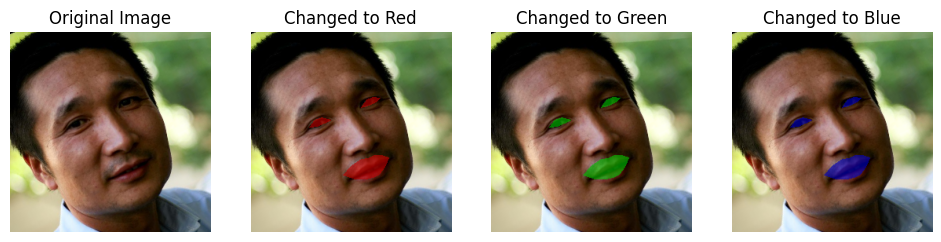

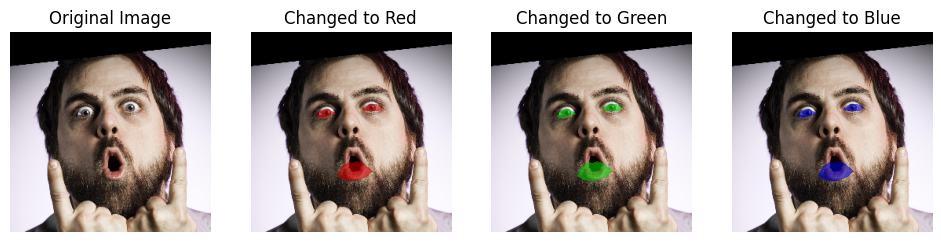

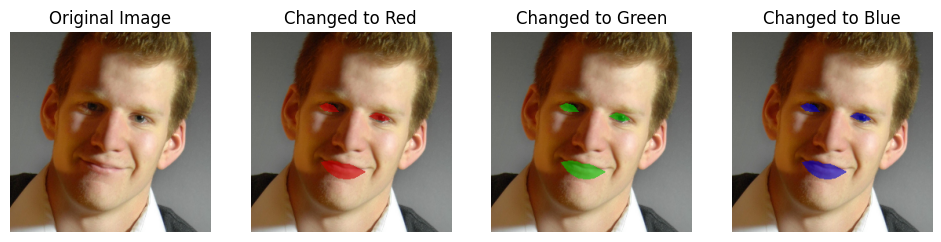

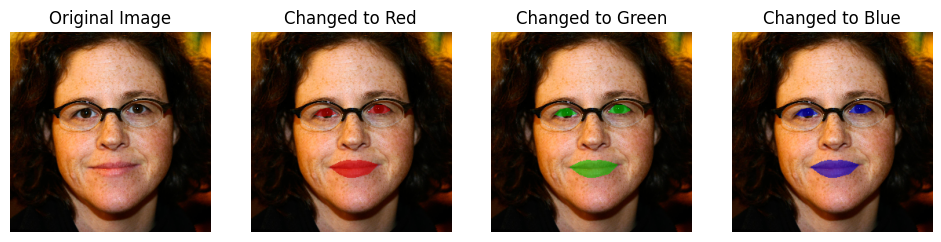

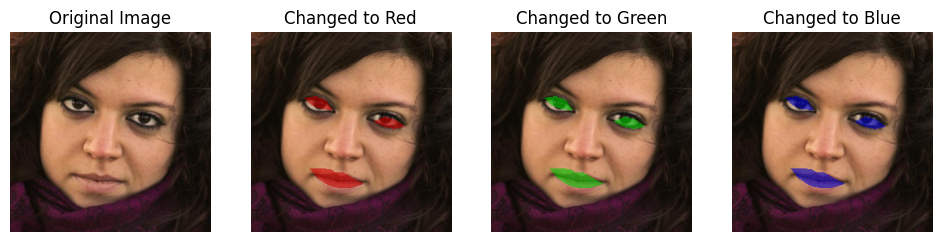

In [ ]:
for i in range(len(example_images)):
  change_colour(example_images[i], initial_landmarks, models)

print all test images with masking

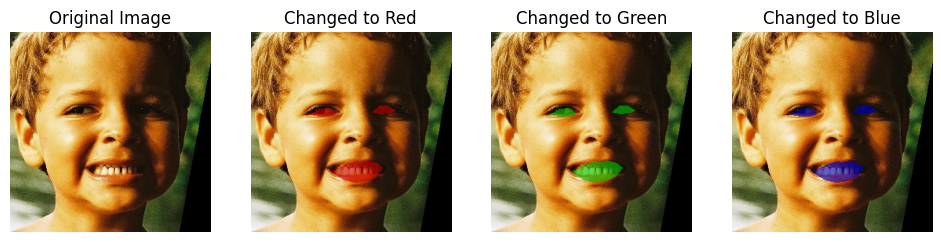

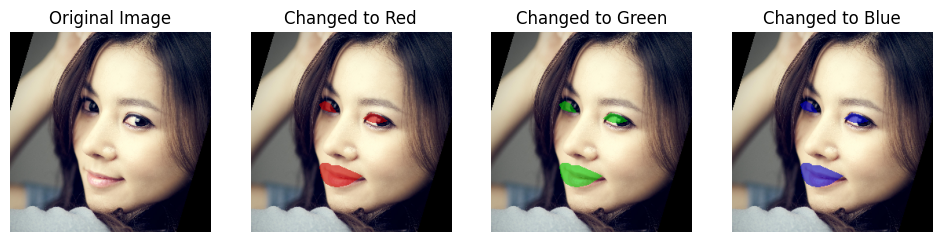

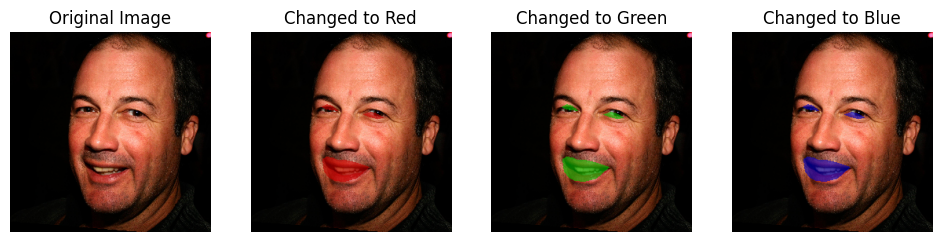

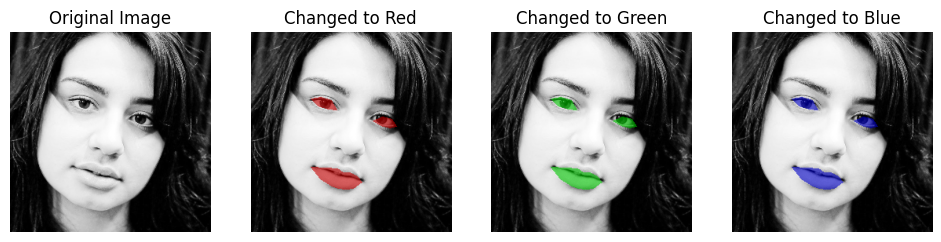

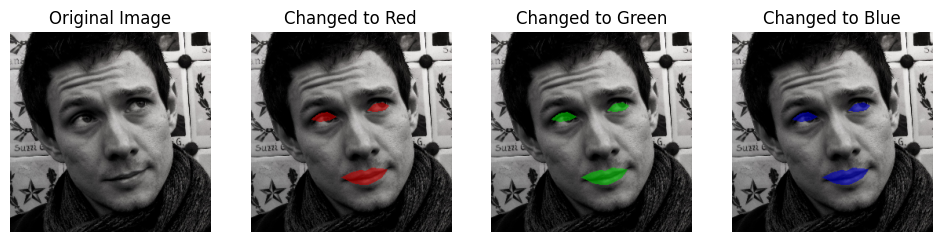

...

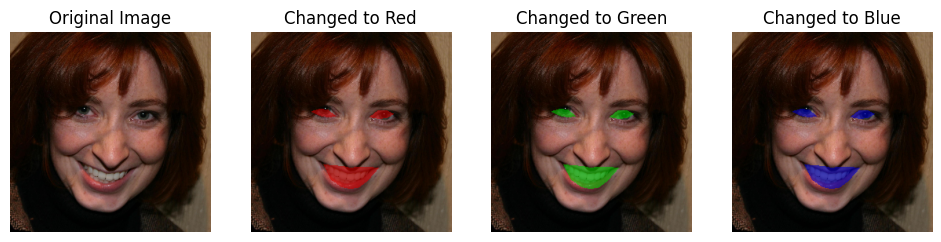

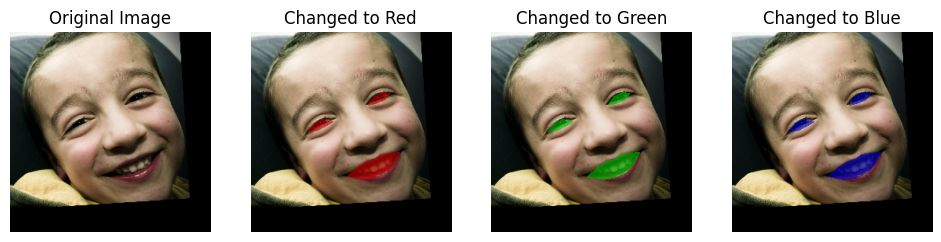

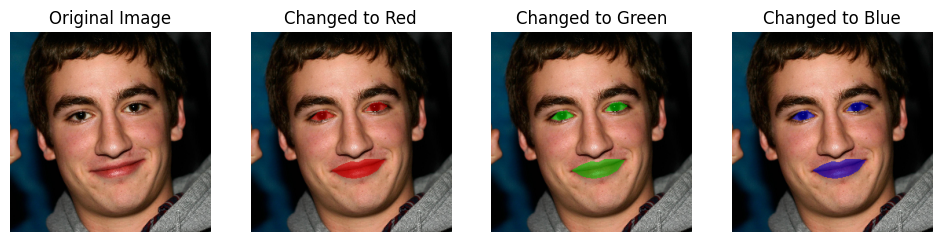

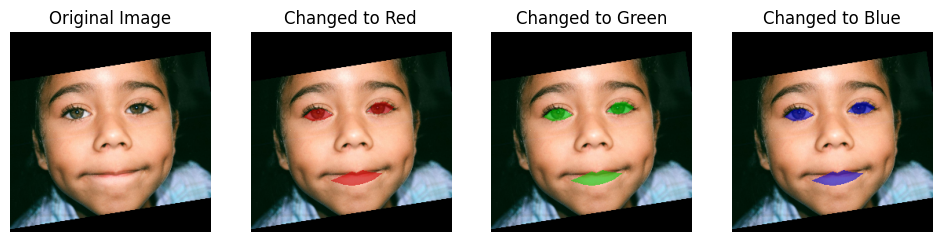

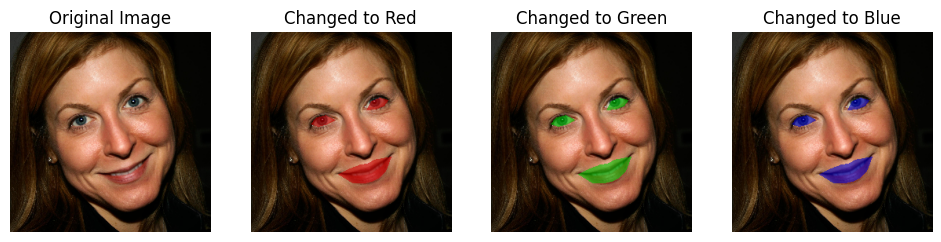

KeyboardInterrupt: 

In [ ]:
for i in range(len(testing_images)):
  change_eyes_lips_colour(testing_images[i], initial_landmarks, models)

# Exporting Results

This function was already given

In [ ]:
def save_as_csv(points, location = '.'):
    """
    Save the points out as a .csv file
    :param points: numpy array of shape (no_test_images, no_points, 2) to be saved
    :param location: Directory to save results.csv in. Default to current working directory
    """
    assert points.shape[0]==554, 'wrong number of image points, should be 554 test images'
    assert np.prod(points.shape[1:])==44*2, 'wrong number of points provided. There should be 44 points with 2 values (x,y) per point'
    np.savetxt(location + '/results.csv', np.reshape(points, (points.shape[0], -1)), delimiter=',')


To make the csv file for final submit

In [ ]:
Landmark_predictions = [] # Initialize an empty list to store the landmark predictions for each image

for image in testing_images_processed:
  # Reshape the image
  final_test = image.reshape(1,256,256)
  # Use the SDM model to get the landmarks for the current image
  final_landmarks = Predicting(final_test, initial_landmarks, models)
  # Reshape the output
  final_landmarks = final_landmarks.reshape(44,2)
  # Append to list
  Landmark_predictions.append(final_landmarks)

final = np.array(Landmark_predictions)
save_as_csv(final)